# Pancreas dataset

En este Notebook, vamos a llevar a cabo el análisis del conjunto de datos de pancreas.
Este análisis consta de tres partes:
1. **Creación de la matriz de lecturas.** En este primer paso, el cual es necesario para poder trabajar el conjunto de datos con dynverse en R, generamos la matriz de lecturas y guardamos en ficheros ".csv" los datos correspondientes a los nombres de las células y de los genes, las agrupaciones y las coordenadas de la reducción de dimensionalidad utilizada.
2. **Análisis del dataset según scVelo.** Puesto que este dataset ha sido analizado por los creadores de scVelo, vamos a replicar el análisis llevado a cabo por ellos, aunque añadiendo otros análisis adicionales de interes como la representación de las "root cells" y los "endpoints", o  de los genes más importantes.
3. **Análisis de los datos según Velocyto.** Para poder comparar entre los distintos métodos, también vamos a llevar a cabo un análisis de los datos de pancreas siguiendo el modelo de análisis estándar de Velocyto.

Plataforma: 10x Genomics

In [3]:
import os
import re
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import igraph
import scvelo as scv
import loompy
import anndata
import numpy as np
import scipy.io as sio
import velocyto as vcy

In [4]:
import scipy

In [5]:
import sys
import matplotlib
import loompy
import logging
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy.interpolate import interp1d

In [6]:
# Color palette for our dataset
pancreas_color_palette = {'Ductal': '#6F4375', 'Ngn3 low EP': '#ED070B', 'Ngn3 high EP': '#F8961E', 
                     "Pre-endocrine": "#F9C74F","Beta": "#90BE6D", "Alpha": "#43AA8B",
                     "Epsilon": "#577590", "Delta": "#B2ABF2"}

Here, we present a brief overview of the data we're going to be working with.

In [14]:
pancreas_dt = scv.datasets.pancreas()

  0%|          | 0.00/50.0M [00:00<?, ?B/s]

In [15]:
pancreas_dt

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [16]:
# show proportions of spliced/unspliced groupby=ndances
scv.utils.show_proportions(pancreas_dt)

Abundance of ['unspliced', 'spliced']: [0.17 0.83]


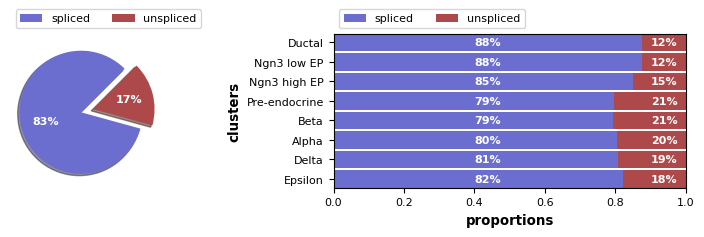

In [17]:
scv.pl.proportions(pancreas_dt, groupby="clusters")

## 1. Save "counts" matrix, barcodes, genes and clusters

In [ ]:
pancreas_dt = scv.datasets.pancreas()

In [ ]:
# Here, we're accesing the "counts" matrix and saving it as a variable
pancreas_matrix = pancreas_dt.X.transpose()
pancreas_matrix

In [ ]:
sio.mmwrite("data/pancreas_sparse_matrix.mtx",pancreas_matrix)

In [ ]:
# Here, we are saving the barcodes (cell_names)
barcodes = pancreas_dt.obs_names.to_frame()
barcodes

In [ ]:
barcodes.to_csv(path_or_buf="data/pancreas_barcodes.csv", sep="\t", header=False)

In [ ]:
# Here, we are saving the genes
features = pancreas_dt.var_names.to_frame()
features

In [ ]:
features.to_csv(path_or_buf="data/pancreas_genes.csv", sep="\t", header=False)

In [ ]:
# Here, I'm going to save the clusters

clusters = pancreas_dt.obs.clusters.to_frame()
clusters.rename(columns = {'clusters':'group_id'}, inplace = True)
clusters

In [ ]:
clusters.to_csv(path_or_buf="data/pancreas_clusters.csv", sep=",", header=True)

In [ ]:
# Save the dimensionality reduction to use it in dynverse

df_umap = pd.DataFrame(pancreas_dt.obsm["X_umap"],
                  index= pancreas_dt.obs_names,
                 columns=["umap_1", "umap_2"])
df_umap

In [ ]:
df_umap.to_csv(path_or_buf="data/pancreas_umap.csv", sep="\t", header=True)

## 2. Análisis según scVelo

### 2.1. Stochastic model

In [18]:
pancreas_stochastic = scv.datasets.pancreas()
pancreas_stochastic

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

#### 2.1.1. Analysis

In [19]:
scv.pp.filter_and_normalize(pancreas_stochastic, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(pancreas_stochastic, n_pcs=30, n_neighbors=30)


Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:44) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [20]:
scv.tl.velocity(pancreas_stochastic, mode="stochastic")

computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [21]:
scv.tl.velocity_graph(pancreas_stochastic)

computing velocity graph (using 1/4 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:49) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_stream.png


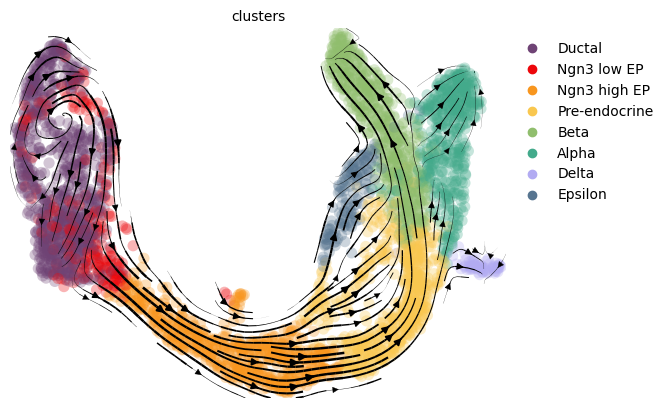

In [23]:
scv.pl.velocity_embedding_stream(pancreas_stochastic, basis='umap', palette=pancreas_color_palette, legend_loc="upper right",
                                 save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_stream.png")

saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_arrows.png


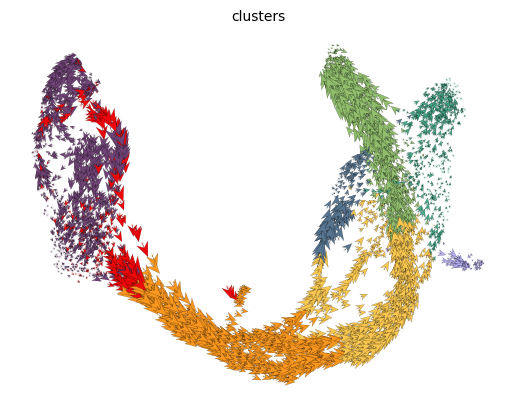

In [31]:
scv.pl.velocity_embedding(pancreas_stochastic, basis='umap', arrow_length=5, arrow_size=5, palette=pancreas_color_palette,
                          save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_arrows.png")

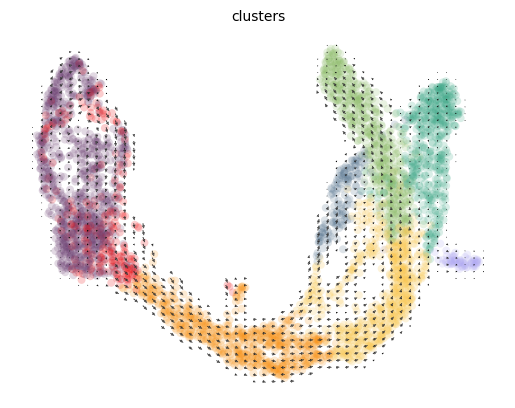

In [32]:
scv.pl.velocity_embedding_grid(pancreas_stochastic, basis='umap', palette=pancreas_color_palette)

#### 2.1.2. Velocity confidence

In [33]:
scv.tl.velocity_confidence(pancreas_stochastic)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [34]:
np.mean(pancreas_stochastic.obs["velocity_confidence"])

0.7917953510748553

In [35]:
np.median(pancreas_stochastic.obs["velocity_confidence"])

0.8150361478328705

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_confidence.png


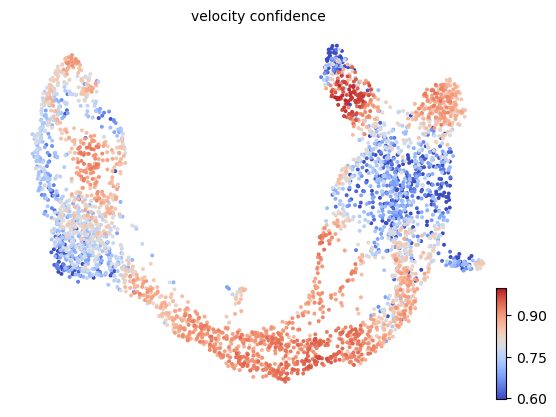

In [36]:
scv.pl.scatter(pancreas_stochastic, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1, 
               save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_confidence.png")
               

#### 2.1.3. Velocity pseudotime (comparable to latent time)

In [37]:
scv.tl.velocity_pseudotime(pancreas_stochastic)

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_pseudotime.png


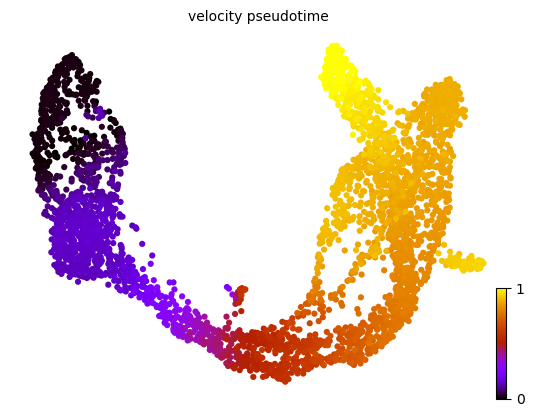

In [42]:
scv.pl.scatter(pancreas_stochastic, basis="umap", color='velocity_pseudotime', color_map='gnuplot', size=80,
              save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_pseudotime.png")

In [39]:
scv.tl.rank_velocity_genes(pancreas_stochastic, groupby='clusters')

ranking velocity genes


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\tools\utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:07) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_pseudotime_heatmap.png


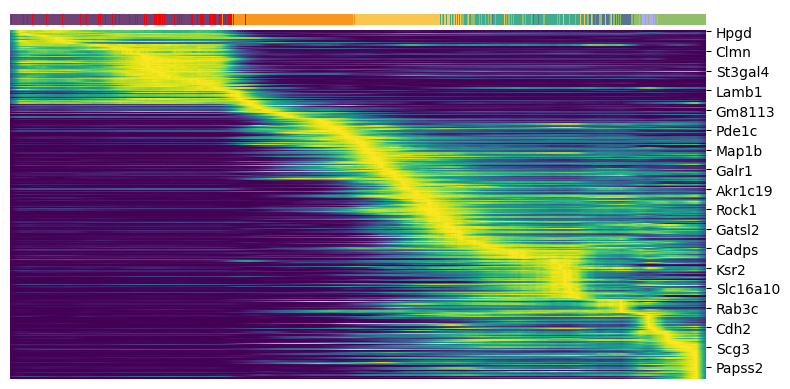

In [43]:
top_genes = pancreas_stochastic.var['spearmans_score'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(pancreas_stochastic, var_names=top_genes, sortby='velocity_pseudotime', col_color='clusters', n_convolve=100,
              save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_pseudotime_heatmap.png")
               

#### 2.1.4. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_root_end.png


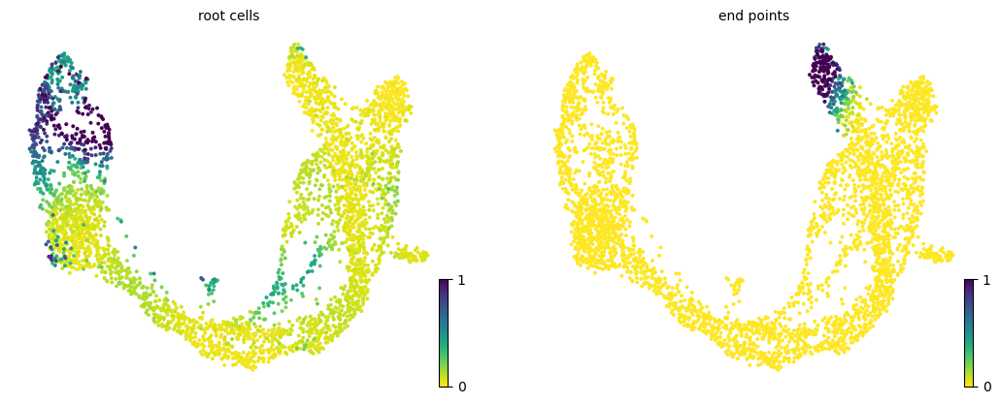

In [44]:
scv.pl.scatter(pancreas_stochastic, color=["root_cells", "end_points"], 
               save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_stochastic_root_end.png")
               

#### 2.1.5. Top-spearmans_score genes

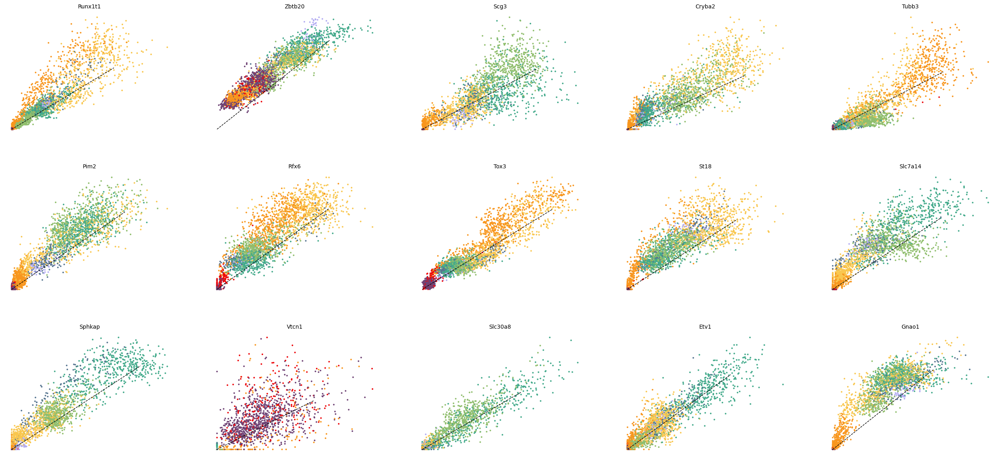

In [45]:
top_genes = pancreas_stochastic.var['spearmans_score'].sort_values(ascending=False).index
scv.pl.scatter(pancreas_stochastic, basis=top_genes[:15], ncols=5, frameon=False)


#### 2.1.6. Cluster-specific top-spearmans_score genes

In [46]:
df = scv.get_df(pancreas_stochastic, 'rank_velocity_genes/names')
df.head(5)

,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Notch2,Ptpn3,Pde1c,Pam,Pax6,Zcchc16,Zdbf2,Tmcc3
1,Sox5,Hacd1,Ptprs,Sdk1,Unc5c,Nlgn1,Spock3,Heg1
2,Krt19,Hspa8,Pclo,Baiap3,Nnat,Nell1,Akr1c19,Gpr179
3,Hspa8,Gm8113,Rap1gap2,Abcc8,Tmem108,Prune2,Ptprt,Ica1
4,Ano6,Kcnq1,Ttyh2,Gnas,Ptprt,Ksr2,Snap25,Ncoa7


### 2.2. Dynamical model

In [47]:
pancreas_dynamical = scv.datasets.pancreas()

#### 2.2.1. Analysis

In [48]:
scv.pp.filter_and_normalize(pancreas_dynamical, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(pancreas_dynamical, n_pcs=30, n_neighbors=30)


Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [49]:
scv.tl.recover_dynamics(pancreas_dynamical)

recovering dynamics (using 1/4 cores)


  0%|          | 0/1298 [00:00<?, ?gene/s]

    finished (0:34:13) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [50]:
scv.tl.velocity(pancreas_dynamical, mode='dynamical')
scv.tl.velocity_graph(pancreas_dynamical)

computing velocities
    finished (0:00:12) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/4 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:27) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [51]:
pancreas_dynamical.write('./data/pancreas_dynamical_analysis.h5ad', compression='gzip')

In [ ]:
pancreas_dynamical = scv.read('data/pancreas_dynamical_analysis.h5ad')

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_stream.png


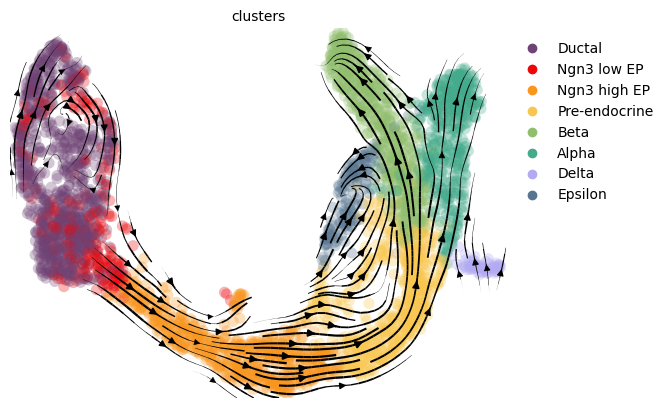

In [52]:
scv.pl.velocity_embedding_stream(pancreas_dynamical, basis='umap', palette=pancreas_color_palette, legend_loc="upper right",
                                 save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_stream.png")


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_arrows.png


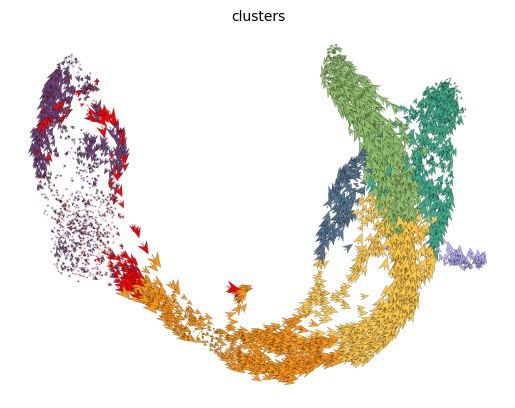

In [53]:
scv.pl.velocity_embedding(pancreas_dynamical, basis='umap', arrow_length=5, arrow_size=5, palette=pancreas_color_palette,
                          save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_arrows.png")


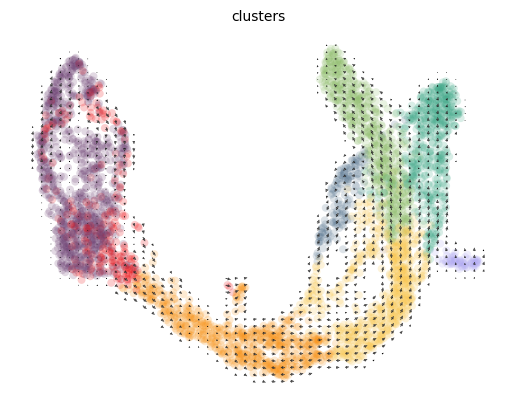

In [54]:
scv.pl.velocity_embedding_grid(pancreas_dynamical, basis='umap', palette=pancreas_color_palette)


#### 2.2.2. Velocity confidence

In [55]:
scv.tl.velocity_confidence(pancreas_dynamical)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [56]:
np.mean(pancreas_dynamical.obs["velocity_confidence"])

0.8534232405431001

In [57]:
np.median(pancreas_dynamical.obs["velocity_confidence"])

0.8609798641264571

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_confidence.png


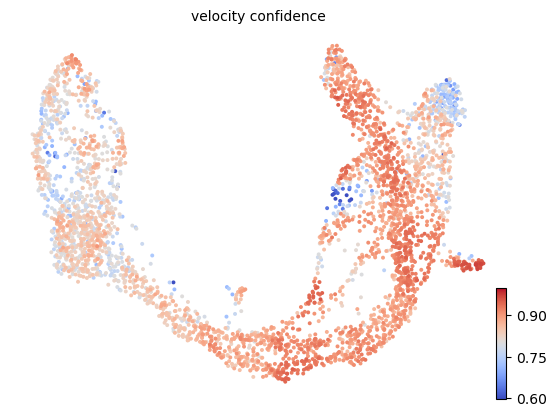

In [58]:
scv.pl.scatter(pancreas_dynamical, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1,
                          save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_confidence.png")

#### 2.2.3. Latent time

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:03) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_latent.png


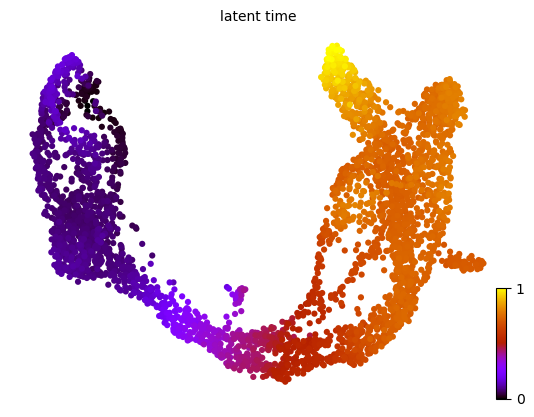

In [59]:
scv.tl.latent_time(pancreas_dynamical)
scv.pl.scatter(pancreas_dynamical, color='latent_time', color_map='gnuplot', size=80,
               save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_latent.png")

saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_latent_heatmap.png


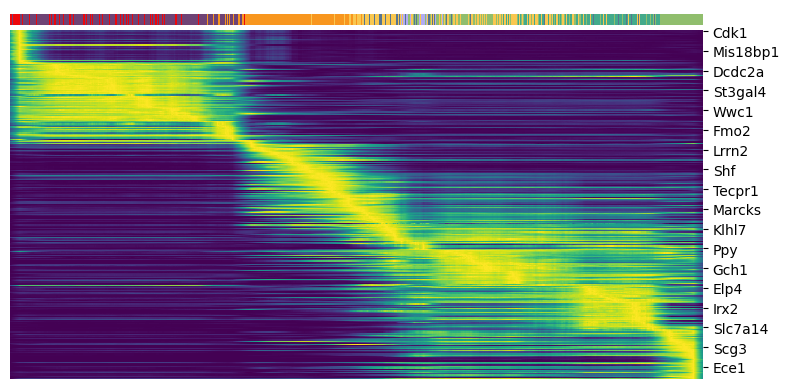

In [60]:
top_genes = pancreas_dynamical.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(pancreas_dynamical, var_names=top_genes, sortby='latent_time', col_color='clusters', n_convolve=100,
               save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_latent_heatmap.png")


#### 2.2.4. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_root_end.png


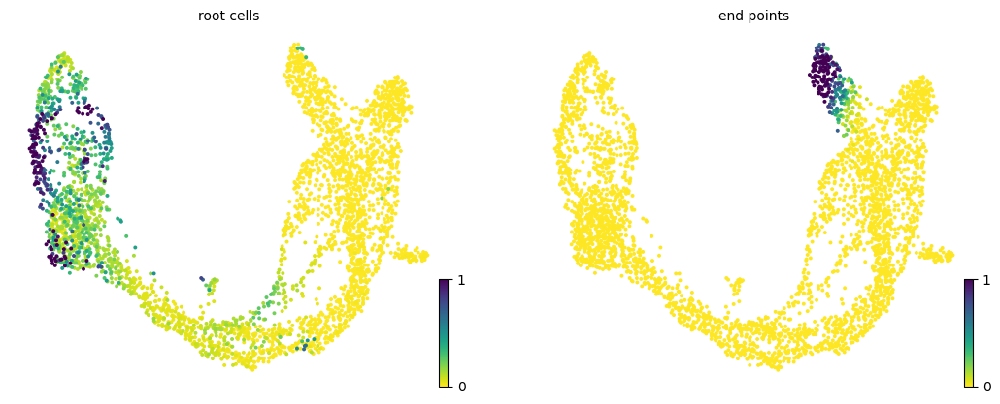

In [61]:
scv.pl.scatter(pancreas_dynamical, color=["root_cells", "end_points"],
               save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_dynamical_root_end.png")

#### 2.2.5. Top-likelihood genes

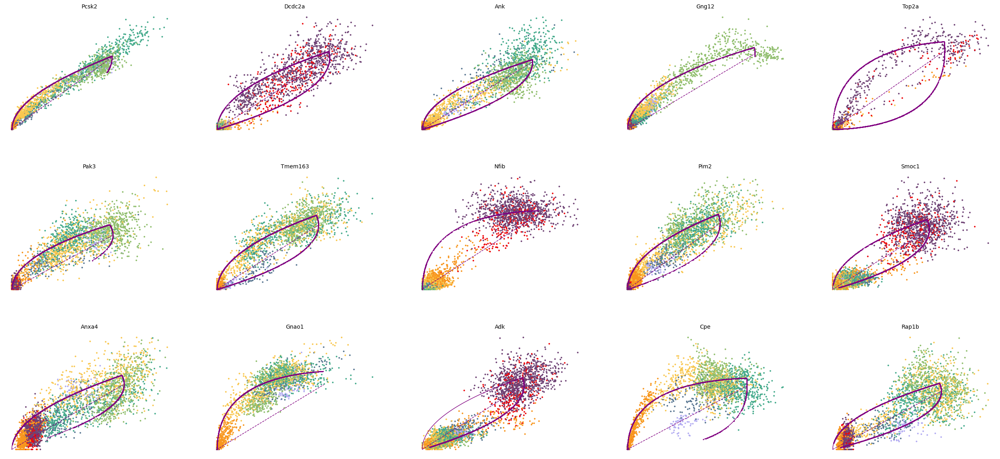

In [62]:
top_genes = pancreas_dynamical.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(pancreas_dynamical, basis=top_genes[:15], ncols=5, frameon=False)


#### 2.2.6. Cluster-specific top-likelihood genes

In [63]:
scv.tl.rank_dynamical_genes(pancreas_dynamical, groupby='clusters')
df = scv.get_df(pancreas_dynamical, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:10) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Dcdc2a,Dcdc2a,Rbfox3,Abcc8,Pcsk2,Cpe,Pcsk2,Tox3
1,Top2a,Adk,Mapre3,Tmem163,Ank,Gnao1,Rap1b,Rnf130
2,Nfib,Mki67,Btbd17,Gnao1,Tmem163,Pak3,Pak3,Meis2
3,Wfdc15b,Rap1gap2,Sulf2,Ank,Tspan7,Pim2,Abcc8,Adk
4,Cdk1,Top2a,Tcp11,Tspan7,Map1b,Map1b,Klhl32,Rap1gap2


### 2.3. Deterministic model

In [7]:
pancreas_deterministic = scv.datasets.pancreas()
pancreas_deterministic

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

#### 2.3.1. Analysis

In [8]:
scv.pp.filter_and_normalize(pancreas_deterministic, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(pancreas_deterministic, n_pcs=30, n_neighbors=30)

Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:23) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [9]:
scv.tl.velocity(pancreas_deterministic, mode="deterministic")

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [10]:
scv.tl.velocity_graph(pancreas_deterministic, n_jobs=8)

computing velocity graph (using 4/4 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:46) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:03) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_stream.png


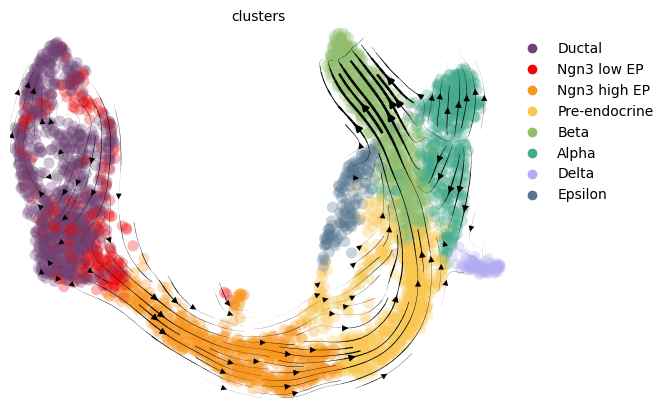

In [11]:
scv.pl.velocity_embedding_stream(pancreas_deterministic, basis='umap', palette=pancreas_color_palette, legend_loc="upper right",
                                 save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_stream.png")


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_arrows.png


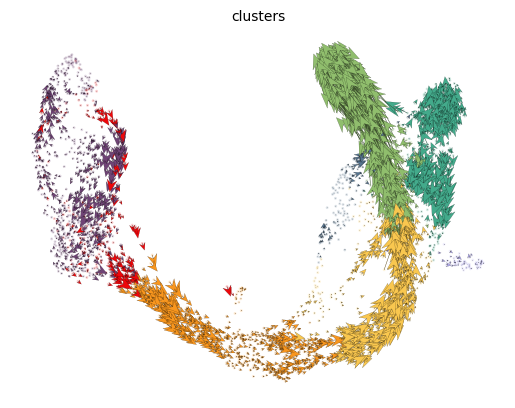

In [12]:
scv.pl.velocity_embedding(pancreas_deterministic, basis='umap', arrow_length=5, arrow_size=5, palette=pancreas_color_palette,
                          save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_arrows.png")


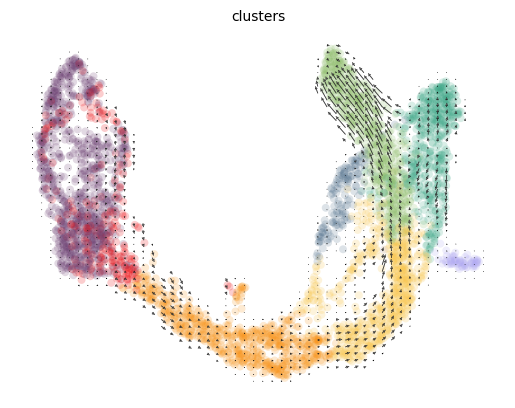

In [13]:
scv.pl.velocity_embedding_grid(pancreas_deterministic, basis='umap', palette=pancreas_color_palette)


#### 2.3.2. Velocity confidence

In [14]:
scv.tl.velocity_confidence(pancreas_deterministic)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [15]:
np.mean(pancreas_deterministic.obs["velocity_confidence"])

0.7125610351377042

In [16]:
np.median(pancreas_deterministic.obs["velocity_confidence"])

0.7285709977149963

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_confidence.png


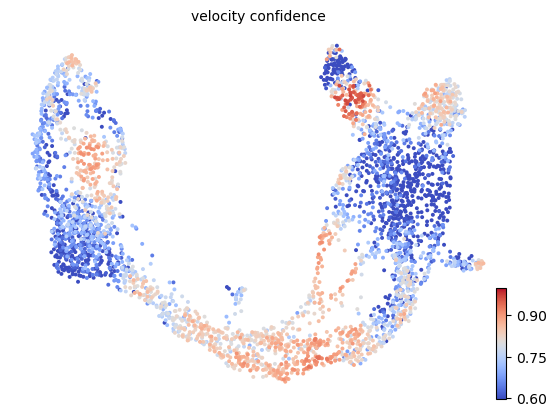

In [17]:
scv.pl.scatter(pancreas_deterministic, c="velocity_confidence", cmap="coolwarm", vmin=0.6, vmax=1,
               save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_confidence.png")

#### 2.3.3. Velocity pseudotime (comparable to latent time)

In [18]:
scv.tl.velocity_pseudotime(pancreas_deterministic)

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_pseudotime.png


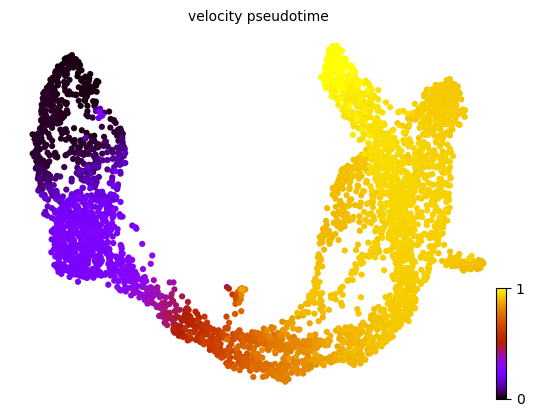

In [19]:
scv.pl.scatter(pancreas_deterministic, basis="umap", color='velocity_pseudotime', color_map='gnuplot', size=80,
              save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_pseudotime.png")

In [20]:
scv.tl.rank_velocity_genes(pancreas_deterministic, groupby='clusters')

ranking velocity genes


C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\tools\utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:07) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_psuedotime_heatmap.png


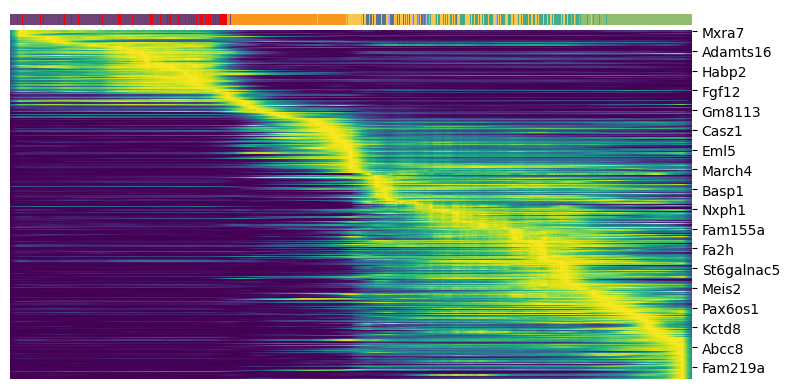

In [21]:
top_genes = pancreas_deterministic.var['spearmans_score'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(pancreas_deterministic, var_names=top_genes, sortby='velocity_pseudotime', col_color='clusters', n_convolve=100,
              save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_psuedotime_heatmap.png")

#### 2.3.4. Root cells and endpoints

C:\Users\Pablo\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_root_end.png


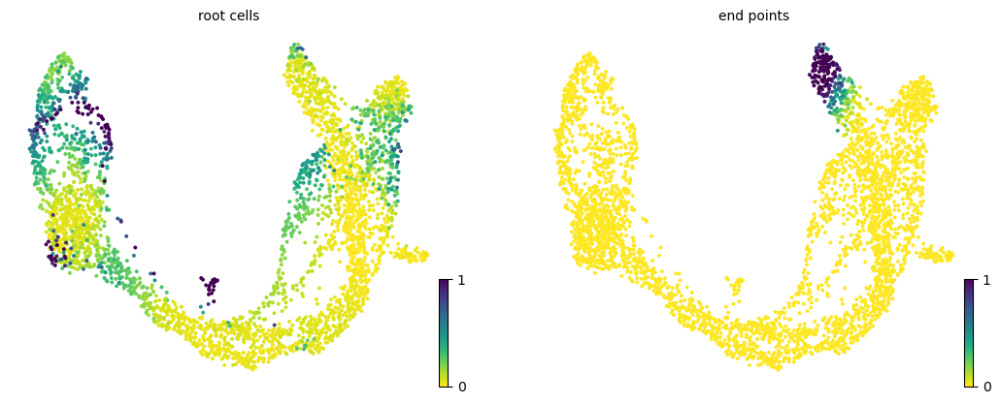

In [22]:
scv.pl.scatter(pancreas_deterministic, color=["root_cells", "end_points"], 
               save="./Results/Plots/velocyto_and_scvelo_plots/pancreas_deterministic_root_end.png")

#### 2.3.5. Top-spearmans_score genes

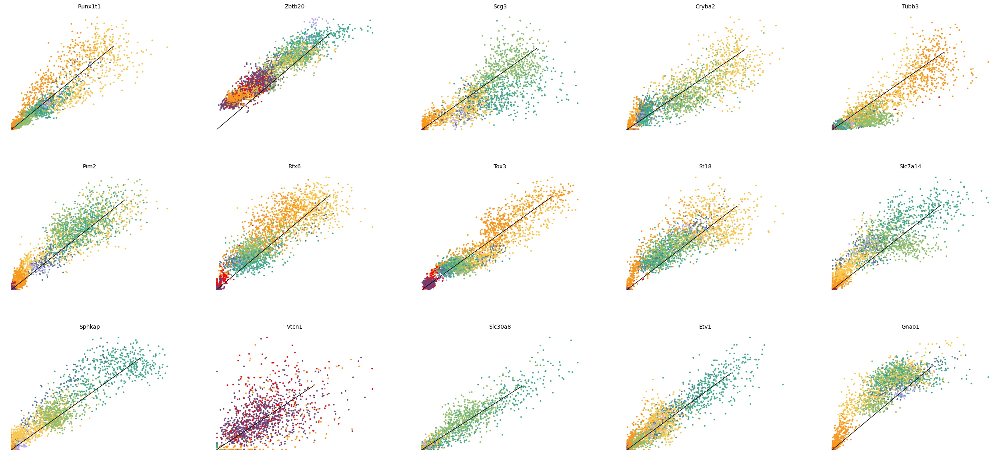

In [23]:
top_genes = pancreas_deterministic.var['spearmans_score'].sort_values(ascending=False).index
scv.pl.scatter(pancreas_deterministic, basis=top_genes[:15], ncols=5, frameon=False, color="clusters")

#### 2.3.6. Cluster-specific top-spearmans_score genes

In [24]:
df = scv.get_df(pancreas_deterministic, 'rank_velocity_genes/names')
df.head(5)

,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Hspa8,Stard10,Cacna2d1,Abcc8,Pax6,Nlgn1,Snap25,Heg1
1,Notch2,Hspa8,Cadps,Pam,Unc5c,Cdh2,Akr1c19,Tmcc3
2,Stard10,Ptpn3,Ptprs,Sdk1,Rnf114,Nfasc,Ank2,Srrm3
3,Sox5,Hacd1,Grik2,Pcsk2,Nnat,Ksr2,Zdbf2,Mamld1
4,Grb10,Rap1gap2,Pde1c,Gnas,Tmem108,Zcchc16,Ptprt,Sphkap


## 3. Velocyto's analysis pipeline

### 3.1. Modelo de Velocyto

#### 3.1.1. Save the dataset as a ".loom" file

Since our dataset has a lot of non-crucial data stored in it, before we save it as a ".loom" (which is the acceptable format for velocyto), we are going to clean it up

In [ ]:
pancreas_dt = scv.datasets.pancreas()
pancreas_dt

In [ ]:
scv.pp.cleanup(pancreas_dt, clean='all')
pancreas_dt

In [ ]:
# In this dataset, we don't have a matrix that corresponds to the ambiguous counts, most likely because scVelo's authors
# didn't considered important but, in velocyto, it's crucial that we have one, even if it's empty, so that's why we add it

pancreas_dt.layers["ambiguous"] = scipy.sparse.csr_matrix((3696, 27998))

In [ ]:
pancreas_dt

In [ ]:
pancreas_dt.write_loom("data/pancreas_dataset.loom", write_obsm_varm=True)

#### 3.1.2. Load the ".loom" file

In [6]:
# Create an analysis object
vlm = vcy.VelocytoLoom("data/pancreas_dataset.loom")

In [7]:
vlm.ca["X_umap"]

array([[ 6.143066  , -0.06364363],
       [-9.906417  ,  0.19777754],
       [ 7.559791  ,  0.58376163],
       ...,
       [-9.88225   , -0.10559414],
       [ 6.6124244 ,  4.531895  ],
       [ 3.0710435 ,  1.1204324 ]], dtype=float32)

In [8]:
# Read column attributes form the loom file
vlm.ts = vlm.ca["X_umap"]  # store the umap coordinates in a new variable

#### 3.1.3. Preliminary filtering

In [9]:
vlm.filter_cells(bool_array=vlm.initial_Ucell_size > np.percentile(vlm.initial_Ucell_size, 0.5))

In [10]:
vlm.set_clusters(vlm.ca["clusters"], cluster_colors_dict=pancreas_color_palette)

In [11]:
vlm.score_detection_levels(min_expr_counts=40, min_cells_express=30)
vlm.filter_genes(by_detection_levels=True)

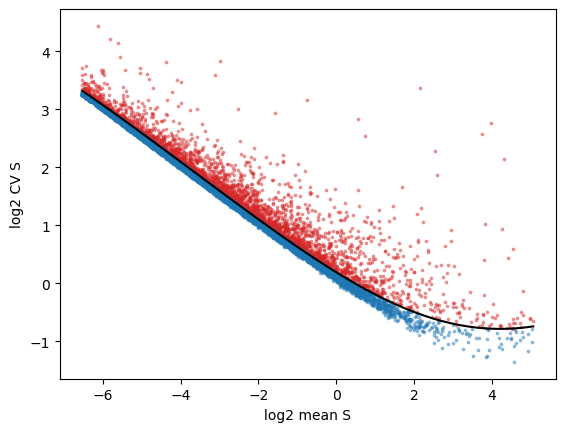

In [12]:
vlm.score_cv_vs_mean(3000, plot=True, max_expr_avg=35)
vlm.filter_genes(by_cv_vs_mean=True)

In [13]:
vlm._normalize_S(relative_size=vlm.S.sum(0),
             target_size=vlm.S.sum(0).mean())
vlm._normalize_U(relative_size=vlm.U.sum(0),
             target_size=vlm.U.sum(0).mean())

#### 3.1.4. Preparation for gamma fit

In [14]:
vlm.perform_PCA()

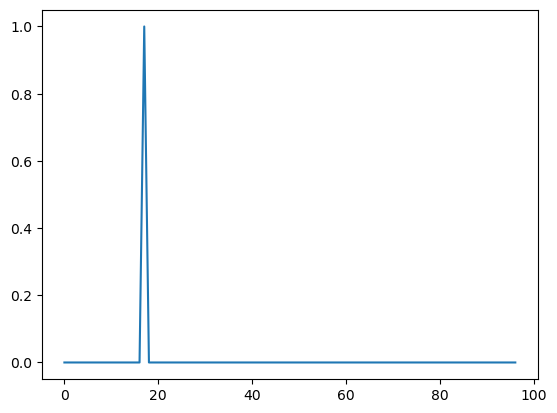

In [15]:
plt.plot(np.diff(np.diff(np.cumsum(vlm.pca.explained_variance_ratio_)[1:100])>0.002))

18

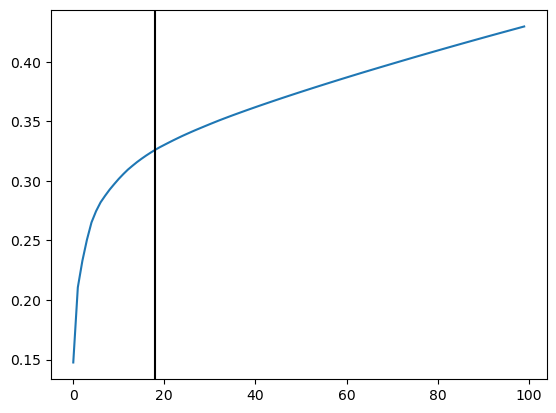

In [25]:
# Im going to add the plot because, even though it's not in the standard analysis pipeline, I find it interesting and I believe it may provide useful insight
# Nope, this graph sucks and is not a good way to determine the number of pcs

plt.plot(np.cumsum(vlm.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(vlm.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
n_comps

In [16]:
k = 500
vlm.knn_imputation(n_pca_dims=20, k=k, balanced=False, b_sight=np.minimum(k*8, vlm.S.shape[1]-1), b_maxl=np.minimum(k*4, vlm.S.shape[1]-1), n_jobs=16) 

## Standard: balanced=True, but for us it didnt work, had to use False
# Conclusion: We're going to use n_pca_dims=20 and k=500 and keep it as false

#### 3.1.5. Gamma fit and extrapolation

In [18]:
vlm.fit_gammas()

In [19]:
vlm.predict_U()
vlm.calculate_velocity()
vlm.calculate_shift(assumption="constant_velocity")
vlm.extrapolate_cell_at_t(delta_t=1.)

#### 3.1.6. Projection of velocity onto embeddings

In [20]:
vlm.estimate_transition_prob(hidim="Sx_sz", embed="ts", transform="sqrt", psc=1,
                             n_neighbors=300, knn_random=True, sampled_fraction=0.5)
  
# The value of n_neighbors here is quite critical.In the tutorial is set to 3500 which is a VERY high number considering the 
# number of cells we're working with, being even higher than in other datasets that have more cells.
# CONCLUSION: We're going to use n_neighbours=300

In [23]:
vlm.calculate_embedding_shift(sigma_corr = 0.05, expression_scaling=True)

In [24]:
vlm.calculate_grid_arrows(smooth=0.8, steps=(40, 40), n_neighbors=300)

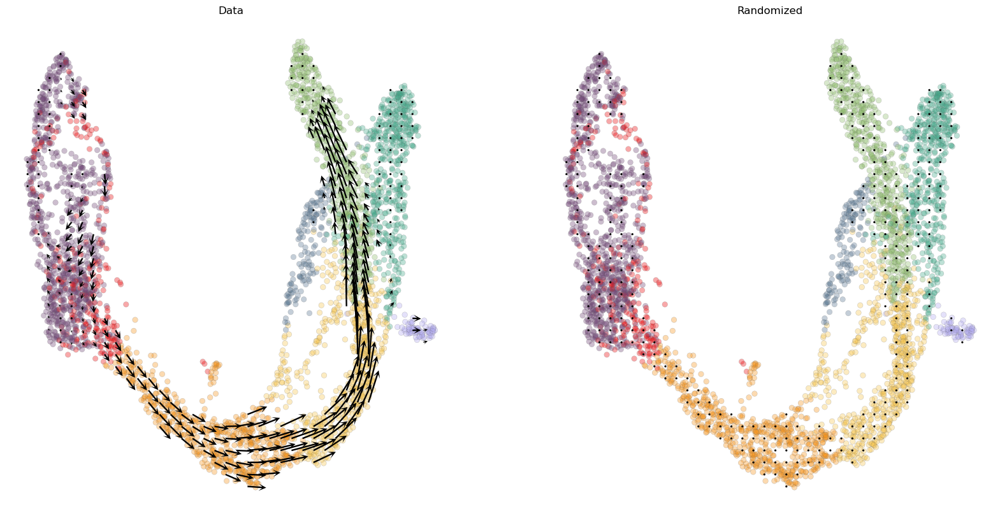

In [26]:
plt.figure(None,(20,10))
vlm.plot_grid_arrows(quiver_scale=0.6,
                    scatter_kwargs_dict={"alpha":0.35, "lw":0.35, "edgecolor":"0.4", "s":38, "rasterized":True}, min_mass=24, angles='xy', scale_units='xy',
                    headaxislength=2.75, headlength=5, headwidth=4.8, minlength=1.5,
                    plot_random=True, scale_type="absolute")

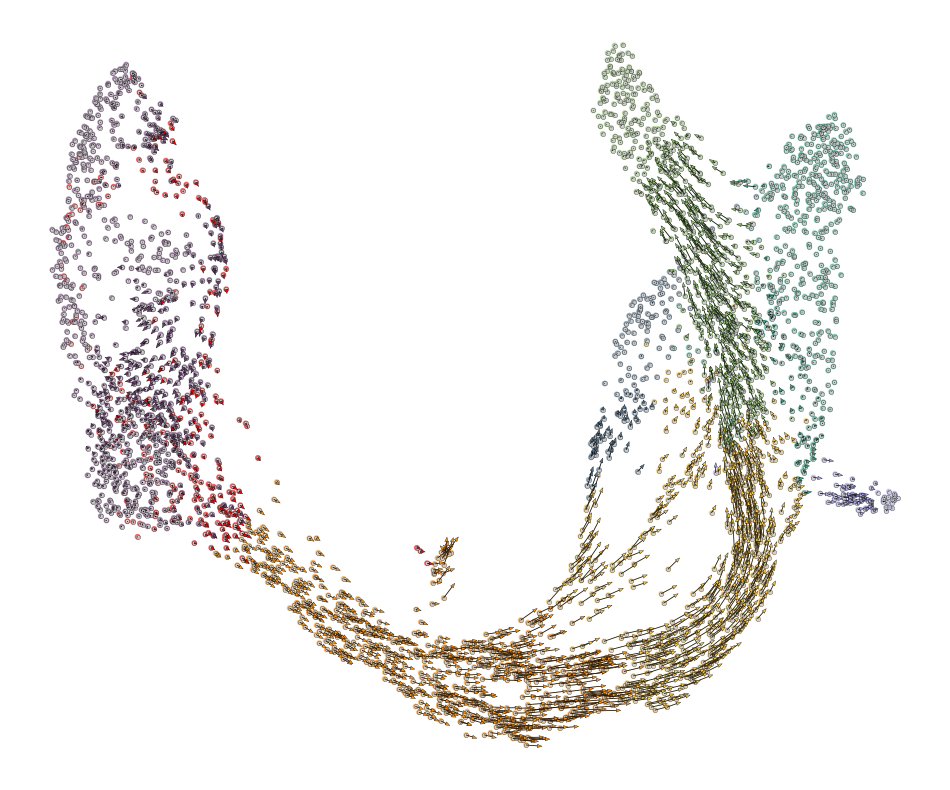

In [30]:
# Fancier plot (from DentateGyrus_velocyto_tutorial.ipynb)

plt.figure(None,(12,10))
quiver_scale = 40

# In this step, we're simply plotting the t-SNE (vlm.embedding[:, 0], vlm.embedding[:, 1] --> x and y coordinates of the t-SNE)
plt.scatter(vlm.embedding[:, 0], vlm.embedding[:, 1],
            c="0.8", alpha=0.6, s=10, edgecolor=vlm.colorandum)       

# We're plotting another scatter plot but the points are drawn in a random order
ix_choice = np.random.choice(vlm.embedding.shape[0], size=int(vlm.embedding.shape[0]/1.), replace=False)
plt.scatter(vlm.embedding[ix_choice, 0], vlm.embedding[ix_choice, 1],
            c="0.8", alpha=0.6, s=10, edgecolor=(0,0,0,1), lw=0.3, rasterized=True)

# Plotting the arrows but in a random order
quiver_kwargs=dict(headaxislength=10, headlength=11, headwidth=8,linewidths=0.25, width=0.00045,edgecolors="k", color=vlm.colorandum[ix_choice], alpha=1)
plt.quiver(vlm.embedding[ix_choice, 0], vlm.embedding[ix_choice, 1],
           vlm.delta_embedding[ix_choice, 0], vlm.delta_embedding[ix_choice, 1],
           scale=quiver_scale, **quiver_kwargs)

plt.axis("off")
plt.savefig("./Results/Plots/velocyto_and_scvelo_plots/pancreas_velocyto_arrows.png")

#### 3.1.7. Root cells and endpoints

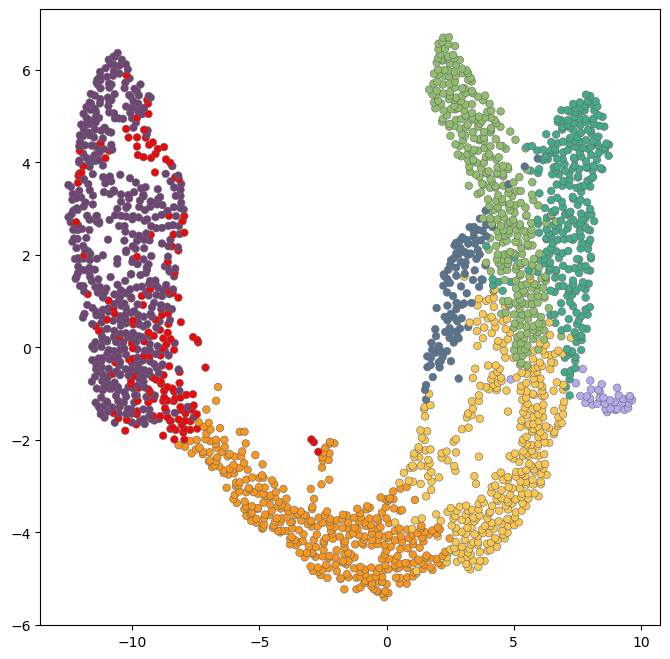

In [31]:
# Sample uniformly the points to avoid density driven effects - Should reimplement as a method
steps = 100, 100
grs = []
for dim_i in range(vlm.embedding.shape[1]): # In the first loop, it does it for the "x" coordinate, and in the second loop, for the "y" coordinate
    m, M = np.min(vlm.embedding[:, dim_i]), np.max(vlm.embedding[:, dim_i]) # Obtain min and max value of the coordinates
    m = m - 0.025 * np.abs(M - m)  # Modify a bit this value. np.abs is used to calculate the absolute value (I don't understand why)
    M = M + 0.025 * np.abs(M - m)  # Modify a bit this value. np.abs is used to calculate the absolute value (I don't understand why)
    gr = np.linspace(m, M, steps[dim_i])  # np.linspace --> Return evenly spaced numbers over a specified interval. 
                                          # (in this case, steps indicates how many values we can have (45), so the spaces are calculated so we only have 45 numbers)
    grs.append(gr) # gr format values for x and y coordinates
    
meshes_tuple = np.meshgrid(*grs) # same values as grs
gridpoints_coordinates = np.vstack([i.flat for i in meshes_tuple]).T # same values as grs, but we've merged the two arrays 
                                                                     # so we have only one with "x" and "y" coordinates

from sklearn.neighbors import NearestNeighbors
nn = NearestNeighbors()
nn.fit(vlm.embedding) # Fit the nearest neighbors estimator from the training dataset, which, in this case, is vlm.embedding
dist, ixs = nn.kneighbors(gridpoints_coordinates, 1)  # Finds the K-neighbors of a point and returns indices of and distances to the neighbors of each point
                                                      # The 1 corresponds to the number of neighbors required for each sample

diag_step_dist = np.sqrt((meshes_tuple[0][0,0] - meshes_tuple[0][0,1])**2 + (meshes_tuple[1][0,0] - meshes_tuple[1][1,0])**2) 
        # substracts the values of the first value of the first two x coordinates, squares it (**2 = squared) 
        # and adds this value to the same step but for the y coordinates 
min_dist = diag_step_dist / 2 # divides the previous value by two
ixs = ixs[dist < min_dist] # cells where dist is less than the min_dist
gridpoints_coordinates = gridpoints_coordinates[dist.flat[:]<min_dist,:]
dist = dist[dist < min_dist]

ixs = np.unique(ixs) # unique cells where dist is less than the min_dist

plt.figure(None,(8,8))
vcy.scatter_viz(vlm.embedding[ixs, 0], vlm.embedding[ixs, 1],
                c=vlm.colorandum[ixs], alpha=1, s=30, lw=0.4, edgecolor="0.4")

In [32]:
# Prepare a transition probability for Markov process

vlm.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2., direction='forward', cells_ixs=ixs)

# sigma_D (float) – the standard deviation used on the locality-limiting component
# sigma_W (float) – the standard deviation used on the noise component
# direction (str, default="backwards") – whether to diffuse forward of backwards (difference in obtaining the endpoints (forward) vs the root cells (backwards))
# cells_ixs (np.ndarray, default=None) – Cells to use, if None all the cells will be considered.

### Returns --> tr (np.ndarray) – the transition probability matrix

In [33]:
# Run a Markov process

vlm.run_markov(starting_p=np.ones(len(ixs)), n_steps=2500) 

# starting_p (np.ndarray, default=None) – specifies the starting density if None is passed an array of 1/self.tr.shape[0] will be created
# n_steps (np.ndarray, default=2500) – Numbers of steps to be performed
# mode (str, default="time_evolution") – this argument is passed to the Diffusion.diffuse call

### Returns --> diffused (np.ndarray) – The probability to be found at any of the states

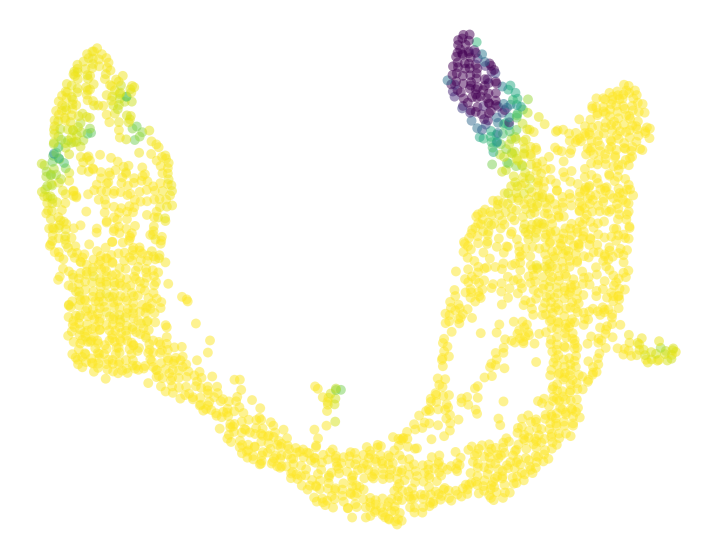

In [34]:
# Endpoints

diffused_n = vlm.diffused - np.percentile(vlm.diffused, 3)
diffused_n /= np.percentile(diffused_n, 97)
diffused_n = np.clip(diffused_n, 0, 1)

plt.figure(None,(9,7))
vcy.scatter_viz(vlm.embedding[ixs, 0], vlm.embedding[ixs, 1],
                c=diffused_n, alpha=0.5, s=50, lw=0., cmap="viridis_r", rasterized=True)
plt.axis("off")
plt.savefig("./Results/Plots/velocyto_and_scvelo_plots/pancreas_velocyto_endpoints.png")

We have to run the code each time we want to generate the root cells because running the code for the endpoints overwrites it

In [35]:
vlm.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2., direction='backwards', cells_ixs=ixs)

In [36]:
vlm.run_markov(starting_p=np.ones(len(ixs)), n_steps=2500)

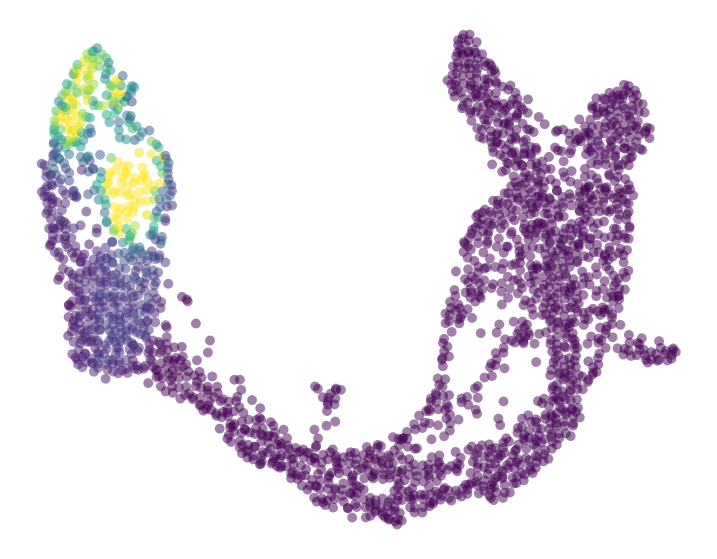

In [38]:
# Root cells

diffused_n = vlm.diffused - np.percentile(vlm.diffused, 3)
diffused_n /= np.percentile(diffused_n, 97)
diffused_n = np.clip(diffused_n, 0, 1)

plt.figure(None,(9,7))
vcy.scatter_viz(vlm.embedding[ixs, 0], vlm.embedding[ixs, 1],
                c=diffused_n, alpha=0.5, s=50, lw=0., cmap="viridis", rasterized=True)
plt.axis("off")
plt.savefig("./Results/Plots/velocyto_and_scvelo_plots/pancreas_velocyto_rootcells.png")